In [53]:
import requests
from bs4 import BeautifulSoup
import datetime
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, cross_val_score
from plotnine import ggplot, aes, geom_line, geom_point, labs

In [2]:
def generate_urls(start_year, end_year, end_month, end_day, urls=None): #Generate the urls of the European Parliment roll-call votes results xml page
    if urls is None:
        urls = []
    current_date = datetime.date(start_year, 1, 1)
    end_date = datetime.date(end_year, end_month, end_day)

    while current_date <= end_date:
        url = f"https://www.europarl.europa.eu/doceo/document/PV-9-{current_date.year}-{current_date.month:02d}-{current_date.day:02d}-RCV_EN.xml"
        urls.append(url)
        current_date += datetime.timedelta(days=1)

    return urls

In [3]:
def generate_fr_url(url): #Replance EN url with FR url when EN url does not exist
    url = url.replace("EN", "FR")
    return url

In [4]:
def parse_xml(url): #Parse the name, votes for and vote against of each vote in plenary sessions
    response = requests.get(url)

    if response.status_code == 200:
        soup = BeautifulSoup(response.content, "lxml-xml")

        roll_call_vote_descriptions = soup.find_all("RollCallVote.Description.Text")

        votes = []

        for roll_call_vote_description in roll_call_vote_descriptions:
            vote_name = roll_call_vote_description.text.strip()

            result_for_tag = roll_call_vote_description.find_previous("Result.For")
            result_against_tag = roll_call_vote_description.find_previous("Result.Against")

            if result_for_tag:
                for_identifiers = {}
                for political_group_list in result_for_tag.find_all("Result.PoliticalGroup.List"):
                    identifier = political_group_list["Identifier"]
                    members = political_group_list.find_all("PoliticalGroup.Member.Name")
                    for_identifiers[identifier] = len(members)
            else:
                for_identifiers = {}

            if result_against_tag:
                against_identifiers = {}
                for political_group_list in result_against_tag.find_all("Result.PoliticalGroup.List"):
                    identifier = political_group_list["Identifier"]
                    members = political_group_list.find_all("PoliticalGroup.Member.Name")
                    against_identifiers[identifier] = len(members)
            else:
                against_identifiers = {}

            vote = {
                "name": vote_name,
                "for": for_identifiers,
                "against": against_identifiers,
            }

            votes.append(vote)

        return votes
    else:
        if "FR" in url:
            print(f"Failed to parse XML for FR link(Status code: {response.status_code}): {url}")
            return []
        else:
            fr_url = generate_fr_url(url)
            urls.append(fr_url)
            if response.status_code == 404:
                 print(f"Failed to parse XML (Status code: {response.status_code}): {url}")
            return []

In [6]:
urls = generate_urls(2019, 2024, 3, 15)

all_votes = []

for url in urls:
    result = parse_xml(url)
    if result is not None:
        all_votes.extend(result)

Failed to parse XML (Status code: 404): https://www.europarl.europa.eu/doceo/document/PV-9-2019-01-01-RCV_EN.xml
Failed to parse XML (Status code: 404): https://www.europarl.europa.eu/doceo/document/PV-9-2019-01-02-RCV_EN.xml
Failed to parse XML (Status code: 404): https://www.europarl.europa.eu/doceo/document/PV-9-2019-01-03-RCV_EN.xml
Failed to parse XML (Status code: 404): https://www.europarl.europa.eu/doceo/document/PV-9-2019-01-04-RCV_EN.xml
Failed to parse XML (Status code: 404): https://www.europarl.europa.eu/doceo/document/PV-9-2019-01-05-RCV_EN.xml
Failed to parse XML (Status code: 404): https://www.europarl.europa.eu/doceo/document/PV-9-2019-01-06-RCV_EN.xml
Failed to parse XML (Status code: 404): https://www.europarl.europa.eu/doceo/document/PV-9-2019-01-07-RCV_EN.xml
Failed to parse XML (Status code: 404): https://www.europarl.europa.eu/doceo/document/PV-9-2019-01-08-RCV_EN.xml
Failed to parse XML (Status code: 404): https://www.europarl.europa.eu/doceo/document/PV-9-2019-

In [145]:
df_all_votes = pd.DataFrame(all_votes) #Convert into DataFrame for more manipualtion convenience
df_all_votes = df_all_votes.iloc[1:] #Deleting first row, empty
df_all_votes.head(100)

,name,for,against
1,European Medicines Agency - A9-0216/2021 - Nic...,"{'ECR': 59, 'ID': 68, 'NI': 21, 'PPE': 172, 'R...","{'ECR': 4, 'ID': 2, 'NI': 9, 'PPE': 1}"
2,Objection under Rule 111(3): Determining cases...,"{'ECR': 54, 'ID': 47, 'NI': 27, 'PPE': 174, 'R...","{'ECR': 7, 'ID': 18, 'NI': 6}"
3,Objection under Rule 111(3): Determining cases...,"{'ECR': 6, 'ID': 2, 'NI': 19, 'Renew': 73, 'S&...","{'ECR': 57, 'ID': 68, 'NI': 13, 'PPE': 172, 'R..."
4,Digital Services Act - A9-0356/2021 - Christel...,"{'ECR': 7, 'ID': 2, 'NI': 19, 'Renew': 74, 'S&...","{'ECR': 56, 'ID': 68, 'NI': 13, 'PPE': 172, 'R..."
5,A9-0356/2021 - Christel Schaldemose - after Ar...,"{'ECR': 44, 'ID': 26, 'NI': 26, 'PPE': 173, 'R...","{'ECR': 7, 'ID': 28, 'NI': 5, 'The Left': 3, '..."
...,...,...,...
96,A9-0356/2021 - Christel Schaldemose - § 4 - Am...,"{'ECR': 4, 'NI': 15, 'PPE': 1, 'Renew': 25, 'S...","{'ECR': 59, 'ID': 67, 'NI': 14, 'PPE': 172, 'R..."
97,A9-0356/2021 - Christel Schaldemose - Recital ...,"{'ECR': 3, 'ID': 23, 'NI': 15, 'Renew': 2, 'S&...","{'ECR': 57, 'ID': 47, 'NI': 14, 'PPE': 173, 'R..."
98,A9-0356/2021 - Christel Schaldemose - Recital ...,"{'ECR': 63, 'ID': 67, 'NI': 29, 'PPE': 173, 'R...","{'ID': 1, 'NI': 1, 'The Left': 2}"
99,A9-0356/2021 - Christel Schaldemose - after Re...,"{'ECR': 53, 'ID': 37, 'NI': 29, 'PPE': 117, 'R...","{'ECR': 7, 'ID': 32, 'NI': 1, 'PPE': 52, 'Rene..."


In [146]:
for_list = [] #Append in a list the for dictonaries of each vote session
i = 0
while i < len(all_votes):
    for_list.append(all_votes[i]['for'])
    i += 1

In [147]:
df_for_list = pd.DataFrame(for_list)
df_for_list.fillna(0, inplace=True) # replace NaN 
df_for_list = df_for_list.drop(columns=['GUE/NGL']) #GUE/NGL is The Left, appears in some Minutes
df_for_list = df_for_list.iloc[1:]
df_for_list.head(100)

,ECR,ID,NI,PPE,Renew,S&D,The Left,Verts/ALE
1,59.0,68.0,21.0,172.0,100.0,144.0,38.0,71.0
2,54.0,47.0,27.0,174.0,100.0,144.0,38.0,71.0
3,6.0,2.0,19.0,0.0,73.0,144.0,38.0,71.0
4,7.0,2.0,19.0,0.0,74.0,144.0,38.0,71.0
5,44.0,26.0,26.0,173.0,100.0,144.0,33.0,66.0
...,...,...,...,...,...,...,...,...
96,4.0,0.0,15.0,1.0,25.0,9.0,35.0,70.0
97,3.0,23.0,15.0,0.0,2.0,10.0,35.0,70.0
98,63.0,67.0,29.0,173.0,100.0,144.0,35.0,70.0
99,53.0,37.0,29.0,117.0,78.0,138.0,30.0,70.0


In [148]:
parliment = {'ECR':68.0, 'ID':59.0, 'NI':50.0, 'PPE':178.0, 'Renew':102.0, 'S&D':139.0, 'The Left':37.0, 'Verts/ALE':72.0} #Import the number of members in each party
parliment_df = pd.Series(parliment)
parliment_df

ECR           68.0
ID            59.0
NI            50.0
PPE          178.0
Renew        102.0
S&D          139.0
The Left      37.0
Verts/ALE     72.0
dtype: float64

In [149]:
for party in df_for_list: #Delete the rows when the number of members is greater than the real number of members for each party
    for name in parliment_df.index:
        if party == name:
            df_for_list.drop(df_for_list[df_for_list[str(party)] > parliment_df[str(name)]].index, inplace = True)
        else:
            continue

In [150]:
df_for_percent = df_for_list / parliment_df * 100 #Divide all the columns by the number of members of each party to get percentage
df_for_percent.head(100)

,ECR,ID,NI,PPE,Renew,S&D,The Left,Verts/ALE
7,76.470588,59.322034,50.0,67.415730,75.490196,100.000000,86.486486,97.222222
9,13.235294,38.983051,10.0,0.000000,14.705882,14.388489,10.810811,97.222222
11,23.529412,35.593220,32.0,0.000000,11.764706,16.546763,32.432432,97.222222
13,0.000000,52.542373,28.0,11.235955,0.000000,1.438849,97.297297,0.000000
16,23.529412,37.288136,30.0,0.000000,11.764706,17.266187,24.324324,97.222222
...,...,...,...,...,...,...,...,...
214,76.470588,33.898305,32.0,5.056180,2.941176,29.496403,94.594595,95.833333
215,75.000000,66.101695,32.0,7.865169,5.882353,23.741007,89.189189,95.833333
216,72.058824,71.186441,32.0,6.179775,28.431373,37.410072,91.891892,94.444444
217,8.823529,33.898305,30.0,2.247191,3.921569,15.107914,89.189189,95.833333


              ECR          ID         NI         PPE       Renew         S&D  \
count  750.000000  750.000000  750.00000  750.000000  750.000000  750.000000   
mean    39.372549   35.850847   36.43200   44.983521   46.458824   48.531415   
std     39.115692   35.221764   13.71832   36.625971   35.616607   36.443331   
min      0.000000    0.000000    0.00000    0.000000    0.000000    0.000000   
25%      0.000000    0.000000   30.00000    5.617978    6.862745    5.755396   
50%     17.647059   28.813559   36.00000   47.471910   60.784314   68.705036   
75%     83.823529   72.881356   42.00000   82.584270   80.147059   80.575540   
max     95.588235   93.220339   78.00000   98.314607   99.019608  100.000000   

         The Left   Verts/ALE  
count  750.000000  750.000000  
mean    40.468468   53.025926  
std     33.745689   41.986118  
min      0.000000    0.000000  
25%      2.702703    0.000000  
50%     43.243243   79.166667  
75%     75.675676   88.888889  
max    100.000000   98.

<Axes: >

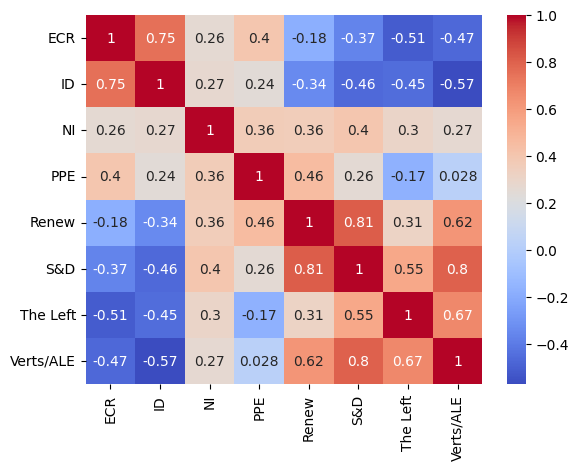

In [171]:
test = df_for_percent[(len(df_for_percent) - 750):len(df_for_percent)] #taking the last plenary sessions, from mid 2023, as dimension for our dataset for linear regression

print(test.describe())
sns.heatmap(test.corr(), annot = True, cmap = 'coolwarm')

In [181]:
#Defining our dependent and independent variables, and splitting for testing
y = test['Verts/ALE']
X = test[['The Left', 'S&D', 'Renew']]
X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 100)
reg_model = linear_model.LinearRegression()
reg_model = LinearRegression().fit(X_train, y_train)

#Pair the feature names with the coefficients
list(zip(X, reg_model.coef_))

#Predicting the Test and Train set result 
y_pred= reg_model.predict(X_test)  
x_pred= reg_model.predict(X_train) 

#Print return metric R2
r2 = metrics.r2_score(y_test, y_pred)
print('R2:', r2)

R2: 0.6783716444291105


In [182]:
#Defining our dependent and independent variables, and splitting for testing
y = test['S&D']
X = test[['Verts/ALE', 'Renew']]
X_train,X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 100)
reg_model = linear_model.LinearRegression()
reg_model = LinearRegression().fit(X_train, y_train)

#Pair the feature names with the coefficients
list(zip(X, reg_model.coef_))

#Predicting the Test and Train set result 
y_pred= reg_model.predict(X_test)  
x_pred= reg_model.predict(X_train) 

#Print return metric R2
r2 = metrics.r2_score(y_test, y_pred)
print('R2:', r2)

R2: 0.7916001834351883


In [99]:
def plot_linear(data, target, reg): #Make a function that returns the plot of the linear regression of a dataset, with a target against a regressor
    
    if target in data and reg in data:
        
        model = LinearRegression().fit(data[[reg]],data[target])
        r = r2_score(y_true = data[target], y_pred = model.predict(data[[reg]]))
        data_ = data.assign(fitted = model.predict(data[[reg]]))
        caption = 'R2 =' + str(r)
        return ggplot(data_) + aes(x=reg,y=target) + geom_point(colour ='blue') + geom_line(aes(y='fitted'), colour = 'red') + labs(title = 'Linear regression of vote results of ' + str(target) + ' vs ' + str(reg), caption = caption)

    else:
        return str(target) + ' and/or ' + str(reg) + ' is not in ' + str(data)


In [100]:
def get_r_squared(data, target, reg): #Make a function that returns the r_squared in a dataset between a target and a regressor

    if target in data and reg in data:
        
        model = LinearRegression().fit(data[[reg]],data[target])
        r = r2_score(y_true = data[target], y_pred = model.predict(data[[reg]]))
        return r

    else:
        return str(target) + ' and/or ' + str(reg) + ' is not in dataset'

In [101]:
keys = []
r = []
i = 0
for x in test.columns[i:]:
    for y in test.columns[i:]:
        if x != y:
            keys.append(str(x) + ' vs ' + str(y))
            r.append(get_r_squared(test, x, y))
        else:
            continue
            
    i += 1

In [102]:
r_squared = dict(zip(keys,r))
r_squared_df = pd.DataFrame(r_squared.items(), columns = ['parties','r_squared'])
r_squared_df

,parties,r_squared
0,ECR vs ID,0.372675
1,ECR vs NI,0.105144
2,ECR vs PPE,0.220920
3,ECR vs Renew,0.044001
4,ECR vs S&D,0.000381
5,ECR vs The Left,0.038488
6,ECR vs Verts/ALE,0.030957
7,ID vs NI,0.086358
8,ID vs PPE,0.026990
9,ID vs Renew,0.003282


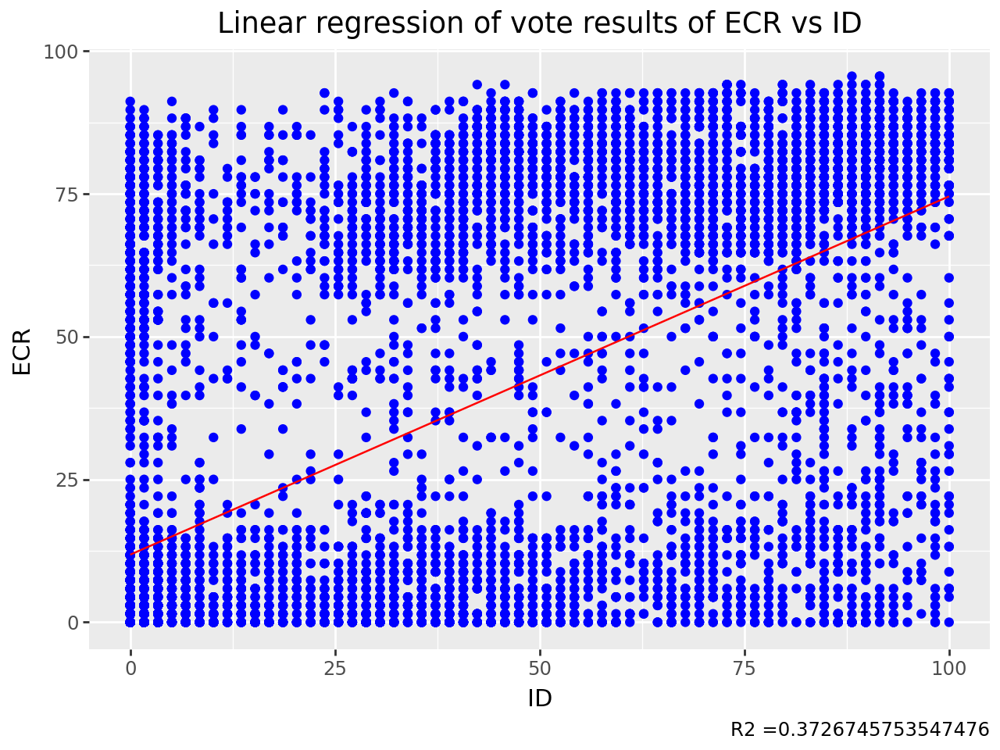

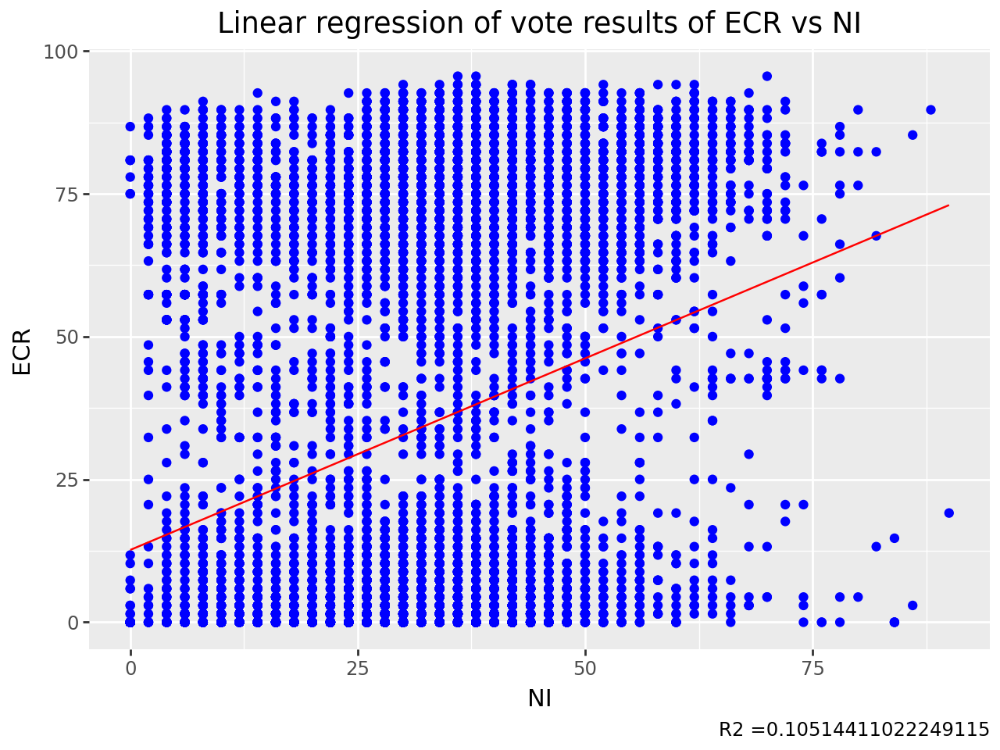

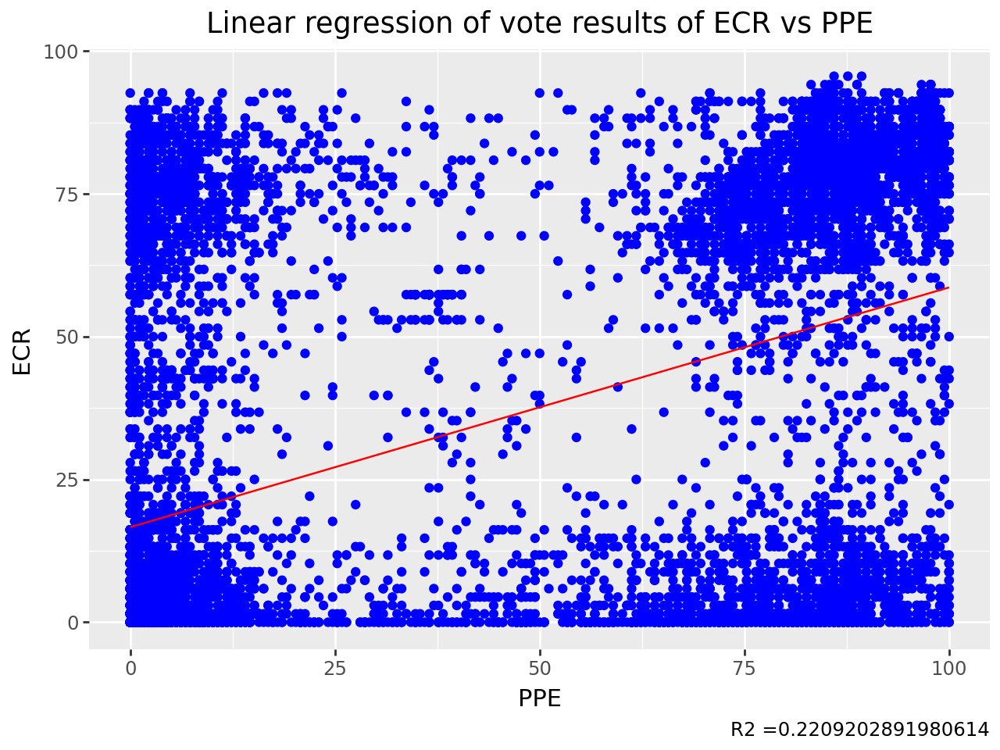

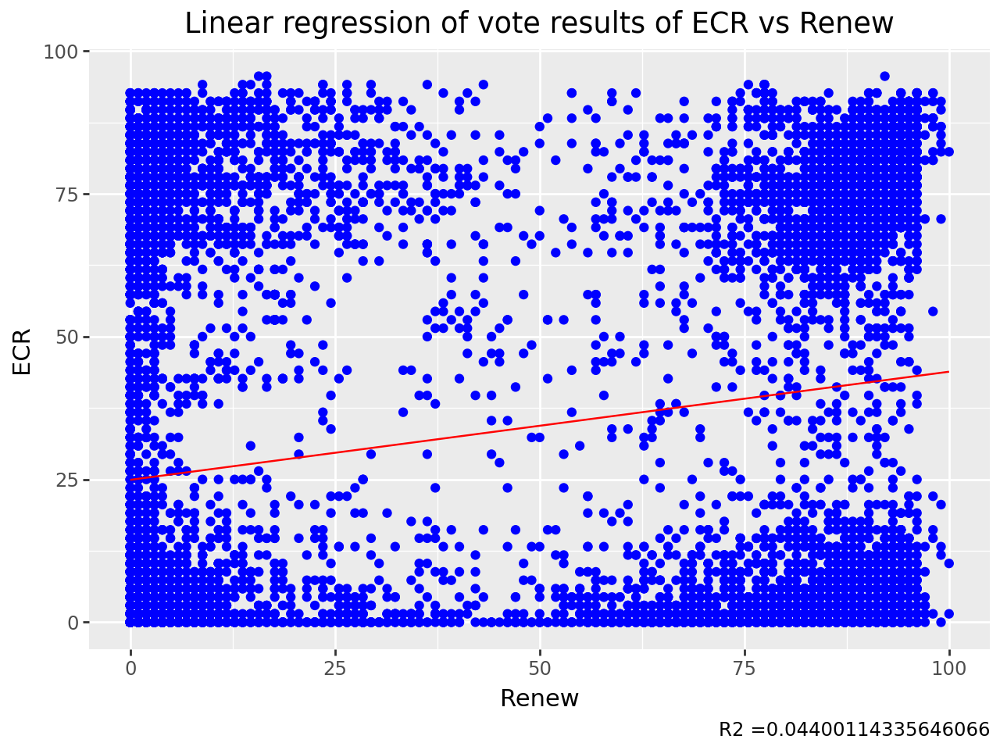

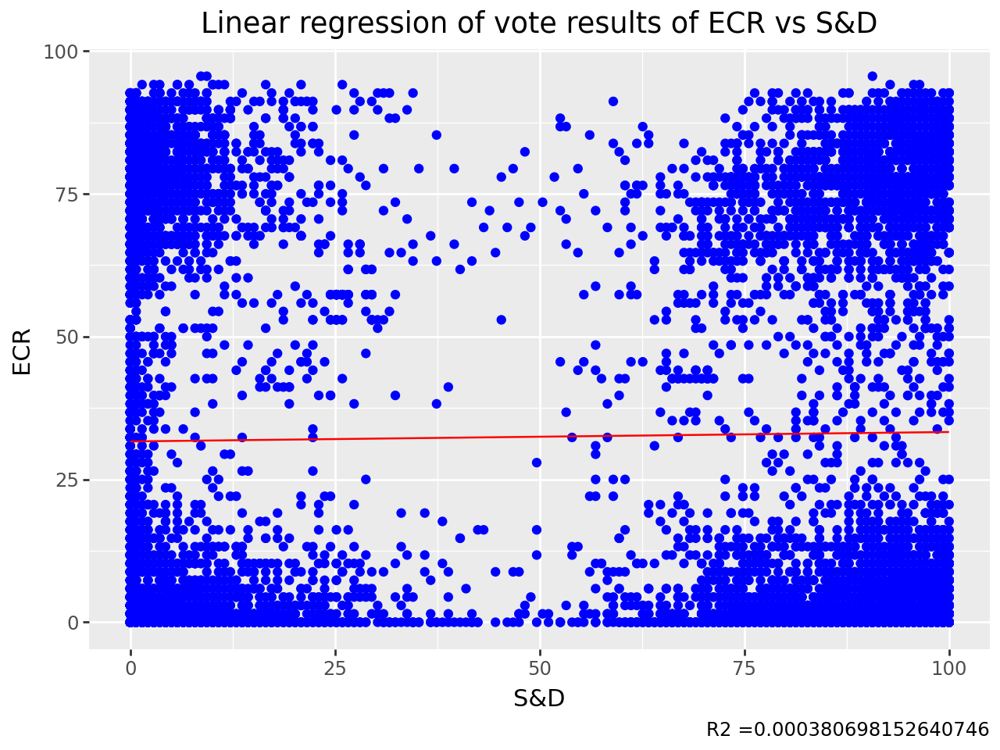

...

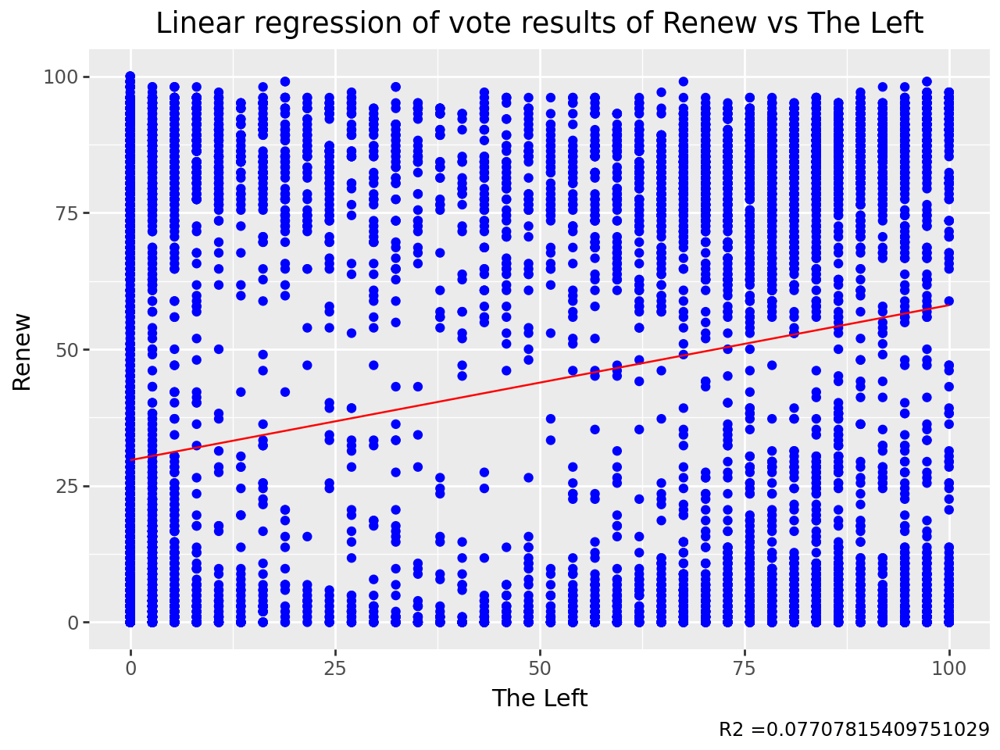

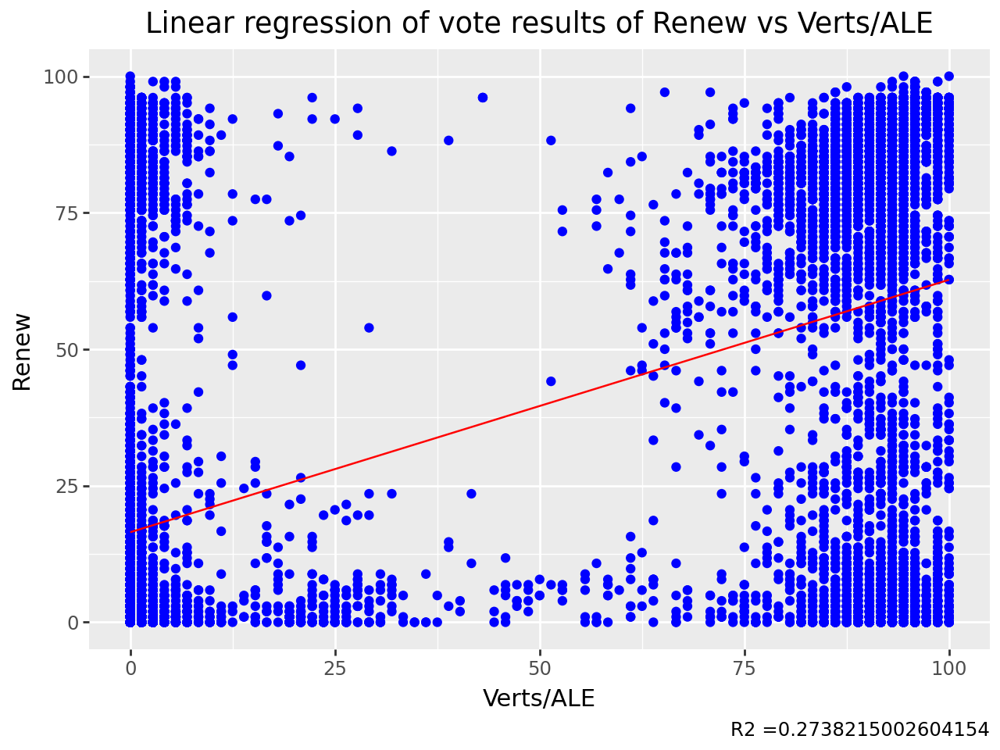

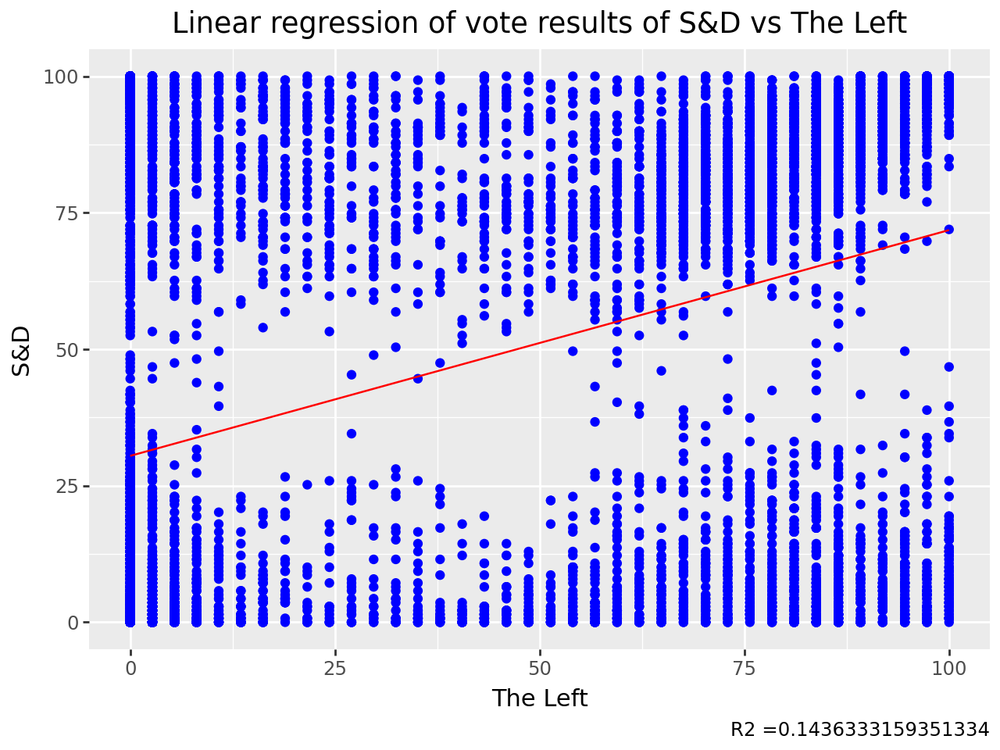

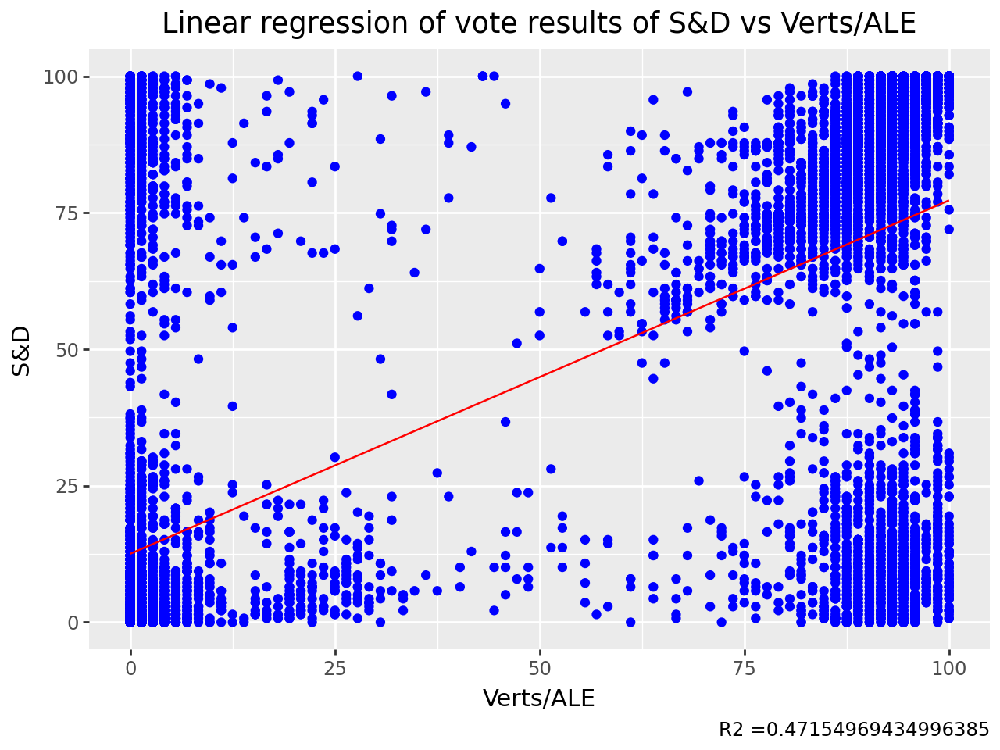

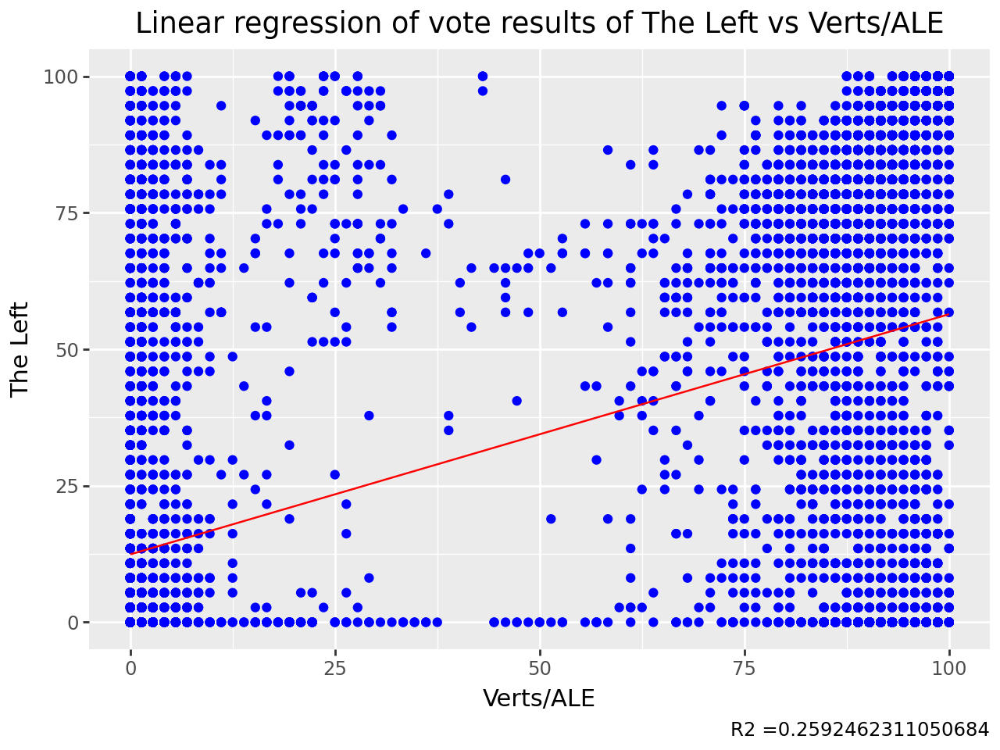

In [103]:
i = 0 #Make loop that takes every party against the other, once, and not with itself
for x in test.columns[i:]:
    for y in test.columns[i:]:
        if x != y:
            plot = plot_linear(test, str(x), str(y))
            plot.show()
        else:
            continue
            
    i += 1